In [1]:
import matplotlib
print(matplotlib.get_cachedir())
import numpy as np
import matplotlib.pyplot as plt

/root/.cache/matplotlib


In [2]:
%config InlineBackend.figure_format = 'retina'


[INFO] 高清矢量图已保存: fault_visualization_horizontal.pdf


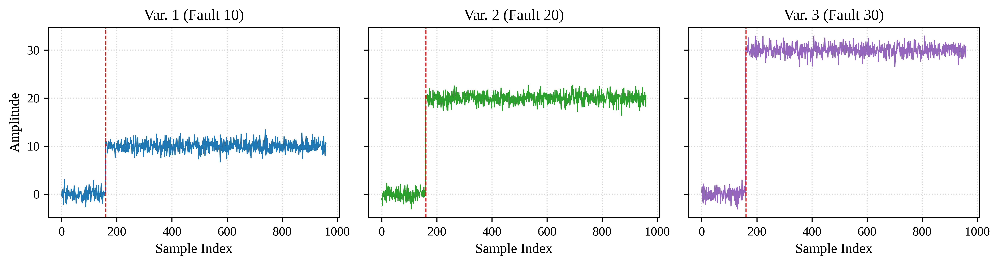

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. SCI 出版级高清字体与排版配置 ---
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"], 
    "mathtext.fontset": "cm", 
    "axes.unicode_minus": False,
    "font.size": 10,
    "axes.titlesize": 12,        
    "axes.labelsize": 11,        
    "xtick.labelsize": 10,       
    "ytick.labelsize": 10,
    "legend.fontsize": 8,        
    "lines.linewidth": 0.8       
})

# --- 2. 数据生成 ---
np.random.seed(2026)
train_data = np.random.standard_normal((52, 500))
np.savetxt("d00.dat", train_data, fmt="%.6f")

test_data = np.random.standard_normal((960, 52))
fault_start = 160
test_data[fault_start:, 0] += 10
test_data[fault_start:, 1] += 20
test_data[fault_start:, 2] += 30
np.savetxt("d01_te.dat", test_data, fmt="%.6f")

# --- 3. 学术风格绘图 (修改为水平排列/一列) ---
# 【核心修改】：(3, 1) -> (1, 3)，代表 1 行 3 列
# 为了美观，figsize 调整为 (10, 3) 左右
fig, axes = plt.subplots(1, 3, figsize=(11, 3), sharex=True, sharey=True, dpi=300)

variables = [0, 1, 2]
steps = [10, 20, 30]
colors = ["#1f77b4", "#2ca02c", "#9467bd"] 

for i, ax in enumerate(axes):
    ax.plot(test_data[:, variables[i]], color=colors[i], linewidth=0.8)
    
    # 子图标题
    ax.set_title(f"Var. {variables[i]+1} (Fault {steps[i]})")
    
    # 仅第一张图显示 Y 轴标签
    if i == 0:
        ax.set_ylabel("Amplitude")
        
    ax.axvline(x=fault_start, color="red", linestyle="--", linewidth=0.8)
    ax.grid(True, linestyle=":", alpha=0.5)
    
    # 设置 X 轴标签
    ax.set_xlabel("Sample Index")

plt.tight_layout()

# 保存
plt.savefig("fault_visualization_horizontal.pdf", format="pdf", bbox_inches="tight", dpi=300)
print("\n[INFO] 高清矢量图已保存: fault_visualization_horizontal.pdf")

plt.show()


[INFO] 高清矢量图已保存: fault_visualization_combined_bottom_legend.pdf


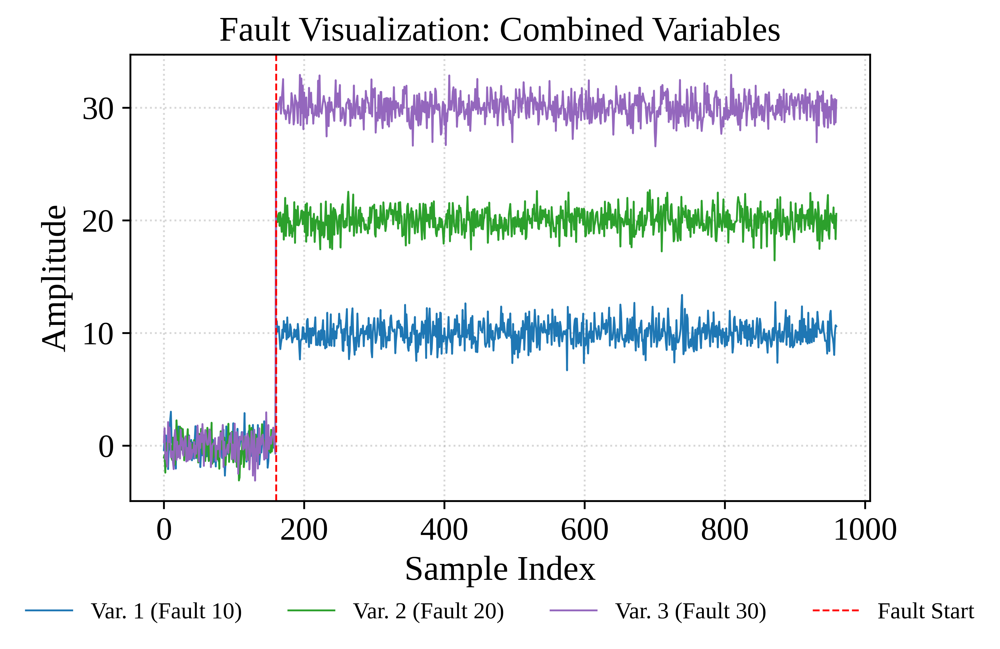

In [40]:
import numpy as np
import matplotlib.pyplot as plt

# --- 1. SCI 出版级高清字体与排版配置 ---
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"], 
    "mathtext.fontset": "cm", 
    "axes.unicode_minus": False,
    "font.size": 13,
    "axes.titlesize": 15,        
    "axes.labelsize": 15,        
    "xtick.labelsize": 14,       
    "ytick.labelsize": 14,
    "legend.fontsize": 10,      # 稍微放大一点图例字体以提高可读性
    "lines.linewidth": 1      
})

# --- 2. 数据生成 ---
np.random.seed(2026)
train_data = np.random.standard_normal((52, 500))
np.savetxt("d00.dat", train_data, fmt="%.6f")

test_data = np.random.standard_normal((960, 52))
fault_start = 160
test_data[fault_start:, 0] += 10
test_data[fault_start:, 1] += 20
test_data[fault_start:, 2] += 30
np.savetxt("d01_te.dat", test_data, fmt="%.6f")

# --- 3. 学术风格绘图 (图例位于正下方) ---
# 稍微增加一点高度 (3.8 -> 4.2)，为下方的横向图例留出物理空间
fig, ax = plt.subplots(figsize=(6, 4.2), dpi=300)

variables = [0, 1, 2]
steps = [10, 20, 30]
colors = ["#1f77b4", "#2ca02c", "#9467bd"] 

# 循环绘制三条曲线
for i in range(len(variables)):
    ax.plot(
        test_data[:, variables[i]], 
        color=colors[i], 
        linewidth=0.8, 
        label=f"Var. {variables[i]+1} (Fault {steps[i]})"
    )

# 统一设置轴标签、轴标题与网格
ax.set_title("Fault Visualization: Combined Variables")
ax.set_xlabel("Sample Index")
ax.set_ylabel("Amplitude")
ax.grid(True, linestyle=":", alpha=0.5)

# 绘制故障发生位置的红色虚线
ax.axvline(x=fault_start, color="red", linestyle="--", linewidth=0.8, label="Fault Start")

# ⭐【核心修改】：将图例放置在整个坐标轴的正下方
# loc="upper center" 配合 bbox_to_anchor=(0.5, -0.18) 代表图例的上边缘对齐 X 轴下方 18% 的位置
# ncol=4 代表将 4 个图例元素横向排列在一行
ax.legend(
    loc="upper center", 
    bbox_to_anchor=(0.5, -0.18), 
    ncol=4, 
    frameon=True, 
    facecolor="white", 
    edgecolor="none", 
    shadow=False
)

plt.tight_layout()

# 保存为新命名的矢量 PDF
pdf_filename = "fault_visualization_combined_bottom_legend.pdf"
# bbox_inches="tight" 会自动识别并包裹住由于超出坐标轴而位于底部的图例，防止裁剪缺失
plt.savefig(pdf_filename, format="pdf", bbox_inches="tight", dpi=300)
print(f"\n[INFO] 高清矢量图已保存: {pdf_filename}")

plt.show()

In [4]:
import importlib
import indicators
import attribution

importlib.reload(indicators)
importlib.reload(attribution)

from indicators import (
    CFG,
    build_models,
    compute_thresholds,
    get_reference_points
)

from attribution import (
    GradientAttribution,
    IGAttribution,
    SHAPAttribution,
    VSFAttribution,
    DeepLIFTAttribution,
    get_unified_output
)

CFG.alpha_t2 = 0.99
CFG.alpha_ae = 0.99

CFG.ae_epochs = 40
CFG.ae_batch_size = 128

CFG.svdd_nu: float = 0.05
CFG.svdd_kernel: str = "rbf"
CFG.svdd_gamma: float = 0.0001


CFG.vsf_step = 0.1
CFG.vsf_max_steps = 50

IG_STEPS = 50
SHAP_NSAMPLES = 200
SHAP_BG_SIZE = 20
FAULT_START_VIS = 160
FIG_DPI = 120


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
df_normal = pd.read_csv("d00.dat", sep=r"\s+", header=None)
df_fault = pd.read_csv("d01_te.dat", sep=r"\s+", header=None)

x_normal_raw = df_normal.values.T
x_outliers_raw = df_fault.values

feature_names = [f"X{i+1}" for i in range(x_normal_raw.shape[1])]

scaler = StandardScaler()
x_normal = scaler.fit_transform(x_normal_raw).astype(np.float32)
x_outliers = scaler.transform(x_outliers_raw).astype(np.float32)

print("x_normal:", x_normal.shape)
print("x_outliers:", x_outliers.shape)
print("feature_names:", feature_names)


x_normal: (500, 52)
x_outliers: (960, 52)
feature_names: ['X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8', 'X9', 'X10', 'X11', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21', 'X22', 'X23', 'X24', 'X25', 'X26', 'X27', 'X28', 'X29', 'X30', 'X31', 'X32', 'X33', 'X34', 'X35', 'X36', 'X37', 'X38', 'X39', 'X40', 'X41', 'X42', 'X43', 'X44', 'X45', 'X46', 'X47', 'X48', 'X49', 'X50', 'X51', 'X52']


AE Epoch 5/40, MSE Loss: 1.052954
AE Epoch 10/40, MSE Loss: 1.029723
AE Epoch 15/40, MSE Loss: 1.014659
AE Epoch 20/40, MSE Loss: 1.003074
AE Epoch 25/40, MSE Loss: 0.994270
AE Epoch 30/40, MSE Loss: 0.988690
AE Epoch 35/40, MSE Loss: 0.985271
AE Epoch 40/40, MSE Loss: 0.982826
Models: dict_keys(['T²', 'SVDD', 'AE'])
Thresholds:
T² 72.74955490368318
SVDD 0.11762050628662105
AE 1.7767800378799437


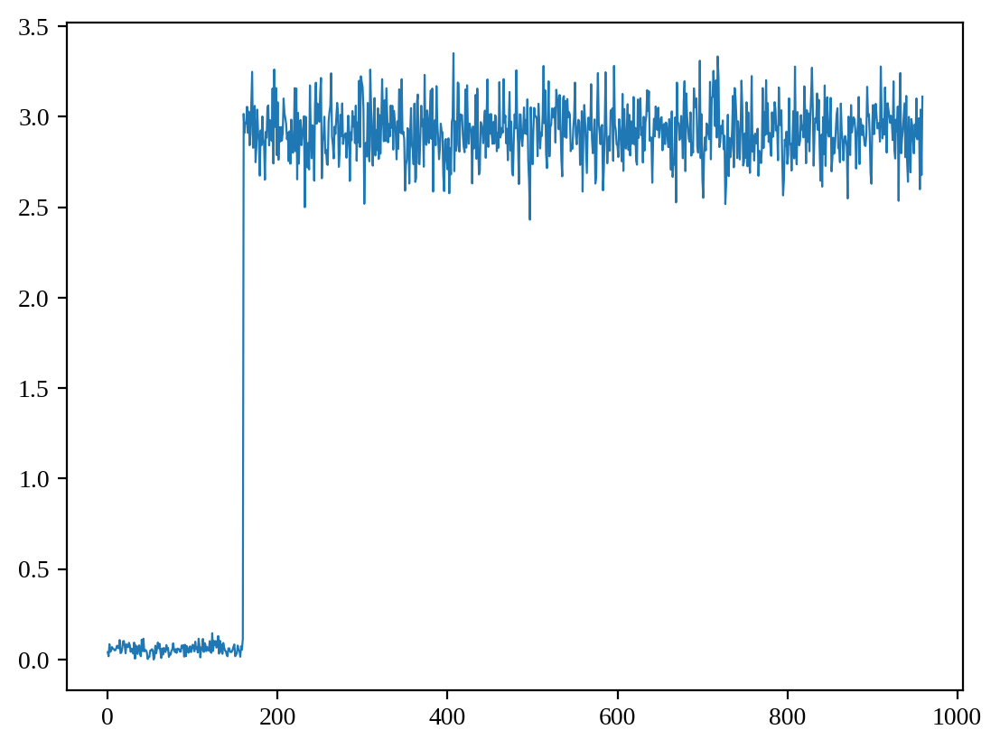

In [6]:
models = build_models(x_normal, config=CFG)
thresholds = compute_thresholds(models, x_normal, config=CFG)
reference_points = get_reference_points(x_normal)

print("Models:", models.keys())
print("Thresholds:")
for k, v in thresholds.items():
    print(k, v)
    
def build_all_explainers(model_name, reference, x_normal, models, method_labels):
    indicator_model = models[model_name]["indicator_model"]
    score_numpy = models[model_name]["score_numpy"]

    bg_size = min(SHAP_BG_SIZE, len(x_normal))
    background = x_normal[:bg_size]

    explainers = {}

    for method in method_labels:
        if method == "Gradient":
            explainers[method] = GradientAttribution(indicator_model)

        elif method == "IG":
            explainers[method] = IGAttribution(
                indicator_model,
                reference,
                steps=IG_STEPS
            )

        elif method == "SHAP":
            explainers[method] = SHAPAttribution(
                score_numpy,
                background,
                nsamples=SHAP_NSAMPLES,
                kmeans=None,
                batch_size=1
            )

        elif method == "VSF":
            explainers[method] = VSFAttribution(
                indicator_model,
                dt=CFG.vsf_step,
                max_steps=CFG.vsf_max_steps,
                grad_tol=CFG.vsf_grad_tol,
                normalize=True
            )

        elif method == "DeepLIFT":
            explainers[method] = DeepLIFTAttribution(
                indicator_model,
                reference=reference
            )

    return explainers



# 2. 取出每个模型的打分函数（直接用这个预测）
t2_score_func = models["T²"]["score_numpy"]
svdd_score_func = models["SVDD"]["score_numpy"]
ae_score_func = models["AE"]["score_numpy"]

# 3. 直接传入数据 → 输出异常分数（越高越异常）
t2_scores = t2_score_func(x_outliers)      # T² 分数
svdd_scores = svdd_score_func(x_outliers)  # SVDD 分数
ae_scores = ae_score_func(x_outliers)      # AE 分数

plt.plot(svdd_scores)
plt.show()


In [7]:
model_names = ["T²", "SVDD", "AE"]
method_labels = ["Gradient", "IG", "SHAP", "VSF", "DeepLIFT"]

fault_start = 0
n_vis = 960

x_vis = x_outliers[fault_start:fault_start + n_vis]
# x_vis = x_outliers  # 使用全部测试集
print(x_vis.shape)

contrib_dict_all = {}

for model_name in model_names:
    print("\n" + "=" * 60)
    print("Processing:", model_name)
    print("=" * 60)

    reference = reference_points[model_name]

    explainers = build_all_explainers(
        model_name,
        reference,
        x_normal,
        models,
        method_labels
    )

    contrib_dict_all[model_name] = {}

    for method in method_labels:
        print("Computing:", model_name, method)
        unified = get_unified_output(explainers[method], x_vis)
        contrib_dict_all[model_name][method] = unified["raw_contrib"]

print("Attribution finished.")


(960, 52)

Processing: T²
Computing: T² Gradient
Computing: T² IG
Computing: T² SHAP
Computing: T² VSF
Computing: T² DeepLIFT


Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished



Processing: SVDD
Computing: SVDD Gradient
Computing: SVDD IG
Computing: SVDD SHAP
Computing: SVDD VSF
Computing: SVDD DeepLIFT


Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished



Processing: AE
Computing: AE Gradient
Computing: AE IG
Computing: AE SHAP
Computing: AE VSF
Computing: AE DeepLIFT
[WARN] DeepLIFT structural failure → fallback (multi-baseline DeepLIFT-like)
Attribution finished.


In [8]:
def check_known_fault_variables(
    contrib_dict_all,
    feature_names,
    true_fault_vars=(0, 1, 2),
    top_k=10
):
    summary = []

    for model_name, contrib_dict in contrib_dict_all.items():
        print("\n" + "=" * 70)
        print(f"Model: {model_name}")
        print("=" * 70)

        for method, contrib in contrib_dict.items():
            contrib = np.asarray(contrib, dtype=np.float32)

            abs_c = np.abs(contrib)
            ratio = abs_c / (abs_c.sum(axis=1, keepdims=True) + 1e-8)

            mean_ratio = ratio.mean(axis=0)
            order = np.argsort(-mean_ratio)

            top_vars = order[:top_k]

            hit_top3 = [v for v in true_fault_vars if v in order[:3]]
            hit_top5 = [v for v in true_fault_vars if v in order[:5]]

            print(f"\nMethod: {method}")
            print("Top variables:", [feature_names[i] for i in top_vars])
            print("Top scores:", [round(float(mean_ratio[i]), 4) for i in top_vars])
            print("True vars in Top-3:", [feature_names[i] for i in hit_top3])
            print("True vars in Top-5:", [feature_names[i] for i in hit_top5])

            summary.append({
                "Model": model_name,
                "Method": method,
                "Top1": feature_names[order[0]],
                "Top2": feature_names[order[1]],
                "Top3": feature_names[order[2]],
                "X1_rank": int(np.where(order == 0)[0][0]) + 1,
                "X2_rank": int(np.where(order == 1)[0][0]) + 1,
                "X3_rank": int(np.where(order == 2)[0][0]) + 1,
                "Top3_hit_count": len(hit_top3),
                "Top5_hit_count": len(hit_top5)
            })

    return pd.DataFrame(summary)


check_df = check_known_fault_variables(
    contrib_dict_all,
    feature_names,
    true_fault_vars=(0, 1, 2),
    top_k=10
)

check_df



Model: T²

Method: Gradient
Top variables: ['X3', 'X2', 'X1', 'X21', 'X37', 'X46', 'X12', 'X14', 'X24', 'X51']
Top scores: [0.1356, 0.0834, 0.044, 0.0344, 0.0289, 0.028, 0.0279, 0.027, 0.0249, 0.0247]
True vars in Top-3: ['X1', 'X2', 'X3']
True vars in Top-5: ['X1', 'X2', 'X3']

Method: IG
Top variables: ['X3', 'X2', 'X1', 'X21', 'X24', 'X37', 'X14', 'X39', 'X51', 'X47']
Top scores: [0.5084, 0.2098, 0.0592, 0.0069, 0.0064, 0.006, 0.0058, 0.0058, 0.0056, 0.0055]
True vars in Top-3: ['X1', 'X2', 'X3']
True vars in Top-5: ['X1', 'X2', 'X3']

Method: SHAP
Top variables: ['X3', 'X2', 'X1', 'X21', 'X47', 'X51', 'X24', 'X16', 'X46', 'X14']
Top scores: [0.5062, 0.2095, 0.0586, 0.0064, 0.0062, 0.0061, 0.0061, 0.0059, 0.0058, 0.0056]
True vars in Top-3: ['X1', 'X2', 'X3']
True vars in Top-5: ['X1', 'X2', 'X3']

Method: VSF
Top variables: ['X3', 'X2', 'X1', 'X21', 'X24', 'X37', 'X14', 'X39', 'X51', 'X47']
Top scores: [0.5084, 0.2098, 0.0592, 0.0069, 0.0064, 0.006, 0.0058, 0.0058, 0.0056, 0.0055]

,Model,Method,Top1,Top2,Top3,X1_rank,X2_rank,X3_rank,Top3_hit_count,Top5_hit_count
0,T²,Gradient,X3,X2,X1,3,2,1,3,3
1,T²,IG,X3,X2,X1,3,2,1,3,3
2,T²,SHAP,X3,X2,X1,3,2,1,3,3
3,T²,VSF,X3,X2,X1,3,2,1,3,3
4,T²,DeepLIFT,X3,X2,X1,3,2,1,3,3
5,SVDD,Gradient,X3,X2,X1,3,2,1,3,3
6,SVDD,IG,X3,X2,X1,3,2,1,3,3
7,SVDD,SHAP,X3,X2,X1,3,2,1,3,3
8,SVDD,VSF,X3,X2,X1,3,2,1,3,3
9,SVDD,DeepLIFT,X3,X2,X1,3,2,1,3,3


In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# SCI 级大图全局排版配置
# ==========================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"], 
    "mathtext.fontset": "cm", 
    # 调大字号，确保在论文双栏排版中依然清晰
    "font.size": 20,
    "axes.titlesize": 24,
    "axes.labelsize": 24,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 15,
    "lines.linewidth": 1.5
})

def plot_known_fault_contribution_curves(contrib_dict_all, feature_names, top_k=5, save_dir="duoweiwei"):
    """
    3行5列布局：
    行 (i) -> 监测模型 (3行: T², SVDD, AE)
    列 (j) -> 归因方法 (5列: Gradient, IG, SHAP, VSF, DeepLIFT)
    """
    os.makedirs(save_dir, exist_ok=True)
    
    model_names = list(contrib_dict_all.keys())
    # 确保方法名称提取顺序固定
    all_methods = sorted(list(set(m for model in contrib_dict_all.values() for m in model.keys())))
    
    n_rows = len(model_names)  # 3行
    n_cols = len(all_methods)  # 5列
    
    # 画布设置：使用 5x3 的宽高比
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), dpi=300)
    
    
    # 确保 axes 为二维
    if n_rows == 1: axes = axes[np.newaxis, :]
    if n_cols == 1: axes = axes[:, np.newaxis]
    
    # 学术顶级配色 (Material Design 风格)
    colors = ['#1f77b4', '#d62728', '#2ca02c', '#ff7f0e', '#9467bd']
    
    for i, model_name in enumerate(model_names):
        for j, method in enumerate(all_methods):
            ax = axes[i, j]
            
            # 数据校验
            if method not in contrib_dict_all[model_name] or contrib_dict_all[model_name][method] is None:
                ax.axis("off")
                continue
            
            contrib = np.abs(np.asarray(contrib_dict_all[model_name][method], dtype=np.float32))
            ratio = contrib / (contrib.sum(axis=1, keepdims=True) + 1e-8)

            mean_ratio = ratio.mean(axis=0)
            order = np.argsort(-mean_ratio)[:top_k]
            
            # 绘制曲线
            for idx, v in enumerate(order):
                line, = ax.plot(ratio[:, v], linewidth=2.0, color=colors[idx % len(colors)], alpha=0.8)
                if i == 0 and j == 0:
                    line.set_label(feature_names[v]) # 仅在左上角记录一次图例
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_color('black')
                spine.set_linewidth(1.5)
            
            ax.grid(True, linestyle="--", alpha=0.2, linewidth=0.5)        


            
            # 标签
            if i == n_rows - 1: ax.set_xlabel("Sample index")
            if j == 0: ax.set_ylabel("Contribution")
            
            # 列标题 (方法名)
            if i == 0:
                ax.set_title(method, pad=20, fontsize=22)
            
            # 行标题 (模型名，放在左侧)
            if j == 0:
                ax.text(-0.2, 0.5, model_name.replace("T²", r"$T^2$"), 
                        transform=ax.transAxes, fontsize=22,
                        ha='right', va='center', rotation=90)
    


    # 【优化图例间距】：borderaxespad=0.1 将图例框与绘图矩阵的间距拉到最小
    fig.legend(loc='lower center', ncol=top_k, frameon=False, 
               fontsize=20, borderaxespad=0.01)
    
    # 【极致压缩】：bottom=0.08，给图例留出的空间刚好放下图例文字即可
    plt.subplots_adjust(left=0.08, right=0.99, top=0.92, bottom=0.08, hspace=0.15, wspace=0.15)
    
    # ... (保存图像逻辑不变) ...
    # 保存图像
    pdf_path = os.path.join(save_dir, "contribution_curves_final.pdf")
    plt.savefig(pdf_path, format="pdf", bbox_inches='tight')
    plt.savefig(os.path.join(save_dir, "contribution_curves_final.png"), dpi=300, bbox_inches='tight')
    
    print(f"\n[INFO] 矢量图已更新: {pdf_path}")
    plt.show()
    plt.close(fig)

# 执行调用
import os
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# SCI 级大图全局排版配置
# ==========================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"], 
    "mathtext.fontset": "cm", 
    # 调大字号，确保在论文双栏排版中依然清晰
    "font.size": 20,
    "axes.titlesize": 24,
    "axes.labelsize": 24,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 15,
    "lines.linewidth": 1.5
})

def plot_known_fault_contribution_curves(contrib_dict_all, feature_names, top_k=5, save_dir="duoweiwei"):
    """
    3行5列布局：
    行 (i) -> 监测模型 (3行: T², SVDD, AE)
    列 (j) -> 归因方法 (5列: Gradient, IG, SHAP, VSF, DeepLIFT)
    """
    os.makedirs(save_dir, exist_ok=True)
    
    model_names = list(contrib_dict_all.keys())
    # 确保方法名称提取顺序固定
    all_methods = sorted(list(set(m for model in contrib_dict_all.values() for m in model.keys())))
    
    n_rows = len(model_names)  # 3行
    n_cols = len(all_methods)  # 5列
    
    # 画布设置：使用 5x3 的宽高比
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), dpi=300)
    
    
    # 确保 axes 为二维
    if n_rows == 1: axes = axes[np.newaxis, :]
    if n_cols == 1: axes = axes[:, np.newaxis]
    
    # 学术顶级配色 (Material Design 风格)
    colors = ['#1f77b4', '#d62728', '#2ca02c', '#ff7f0e', '#9467bd']
    
    for i, model_name in enumerate(model_names):
        for j, method in enumerate(all_methods):
            ax = axes[i, j]
            
            # 数据校验
            if method not in contrib_dict_all[model_name] or contrib_dict_all[model_name][method] is None:
                ax.axis("off")
                continue
            
            contrib = np.abs(np.asarray(contrib_dict_all[model_name][method], dtype=np.float32))
            ratio = contrib / (contrib.sum(axis=1, keepdims=True) + 1e-8)

            mean_ratio = ratio.mean(axis=0)
            order = np.argsort(-mean_ratio)[:top_k]
            
            # 绘制曲线
            for idx, v in enumerate(order):
                line, = ax.plot(ratio[:, v], linewidth=2.0, color=colors[idx % len(colors)], alpha=0.8)
                if i == 0 and j == 0:
                    line.set_label(feature_names[v]) # 仅在左上角记录一次图例
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_color('black')
                spine.set_linewidth(1.5)
            
            ax.grid(True, linestyle="--", alpha=0.2, linewidth=0.5)        


            
            # 标签
            if i == n_rows - 1: ax.set_xlabel("Sample index")
            if j == 0: ax.set_ylabel("Contribution")
            
            # 列标题 (方法名)
            if i == 0:
                ax.set_title(method, pad=20, fontsize=22)
            
            # 行标题 (模型名，放在左侧)
            if j == 0:
                ax.text(-0.2, 0.5, model_name.replace("T²", r"$T^2$"), 
                        transform=ax.transAxes, fontsize=22,
                        ha='right', va='center', rotation=90)
    


    # 【优化图例间距】：borderaxespad=0.1 将图例框与绘图矩阵的间距拉到最小
    fig.legend(loc='lower center', ncol=top_k, frameon=False, 
               fontsize=20, borderaxespad=0.01)
    
    # 【极致压缩】：bottom=0.08，给图例留出的空间刚好放下图例文字即可
    plt.subplots_adjust(left=0.08, right=0.99, top=0.92, bottom=0.08, hspace=0.15, wspace=0.15)
    
    # ... (保存图像逻辑不变) ...
    # 保存图像
    pdf_path = os.path.join(save_dir, "contribution_curves_final.pdf")
    plt.savefig(pdf_path, format="pdf", bbox_inches='tight')
    plt.savefig(os.path.join(save_dir, "contribution_curves_final.png"), dpi=300, bbox_inches='tight')
    
    print(f"\n[INFO] 矢量图已更新: {pdf_path}")
    plt.show()
    plt.close(fig)

# 执行调用
plot_known_fault_contribution_curves(contrib_dict_all, feature_names=feature_names, top_k=5)


[INFO] 矢量图已更新: duoweiwei/contribution_curves_final.pdf


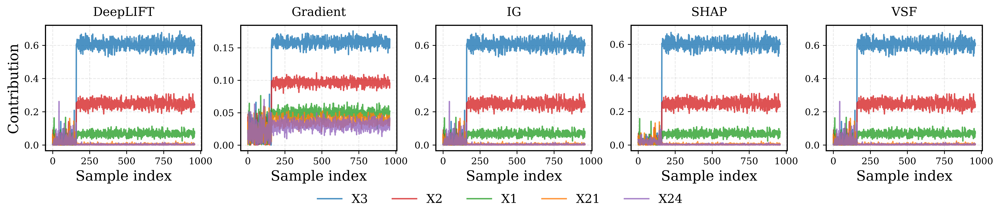

In [35]:
# ==========================================
# 1. 数据过滤：仅提取 T² 模型的数据
# ==========================================
contrib_dict_t2_only = {
    "T²": contrib_dict_all["T²"]
}

# ==========================================
# 2. 重新定义绘图函数 (各子图独立坐标轴)
# ==========================================
def plot_t2_only_curves(contrib_dict, feature_names, top_k=5, save_dir="t2_plots"):
    os.makedirs(save_dir, exist_ok=True)
    
    model_name = "T²"
    methods = sorted(list(contrib_dict[model_name].keys()))
    n_cols = len(methods)
    
    # 【修改 1】：去掉了 sharey=True，并把宽度拉长到 15，给 Y 轴数字留空间
    fig, axes = plt.subplots(1, n_cols, figsize=(15, 3), dpi=300)
    
    colors = ['#1f77b4', '#d62728', '#2ca02c', '#ff7f0e', '#9467bd']
    
    for j, method in enumerate(methods):
        ax = axes[j]
        
        contrib = np.abs(np.asarray(contrib_dict[model_name][method], dtype=np.float32))
        ratio = contrib / (contrib.sum(axis=1, keepdims=True) + 1e-8)
        
        mean_ratio = ratio.mean(axis=0)
        order = np.argsort(-mean_ratio)[:top_k]
        
        # 绘制
        for idx, v in enumerate(order):
            line, = ax.plot(ratio[:, v], linewidth=1.5, color=colors[idx % len(colors)], alpha=0.8)
            if j == 0: line.set_label(feature_names[v])
            
        ax.grid(True, linestyle="--", alpha=0.3)
        ax.set_title(method, fontsize=13, pad=10)
        
        if j == 0:
            ax.set_ylabel("Contribution", fontsize=15)
        ax.set_xlabel("Sample index", fontsize=15)
        
        # 统一设置轴样式
        for spine in ax.spines.values():
            spine.set_linewidth(1.2)
            
        # 强制把刻度标签变小，防止互相打架
        ax.tick_params(axis='both', which='major', labelsize=10)

    # 全局图例
    fig.legend(loc='lower center', bbox_to_anchor=(0.5, -0.1), 
               ncol=top_k, frameon=False, fontsize=13)
    
    plt.tight_layout()
    
    # 【修改 2】：必须把 wspace 拉大（推荐 0.25 ~ 0.3），否则独立 Y 轴的数字会重叠
    plt.subplots_adjust(wspace=0.25) 
    
    # 保存
    plt.savefig(os.path.join(save_dir, "t2_only_curves.pdf"), format="pdf", bbox_inches='tight')
    plt.show()

# ==========================================
# 3. 执行调用
# ==========================================
plot_t2_only_curves(contrib_dict_t2_only, feature_names=feature_names, top_k=5)


Removal test for T² using VSF

Removal test for SVDD using VSF

Removal test for AE using VSF

[INFO] 统一图例版高清矢量图已保存至: removal_test_3cols.pdf


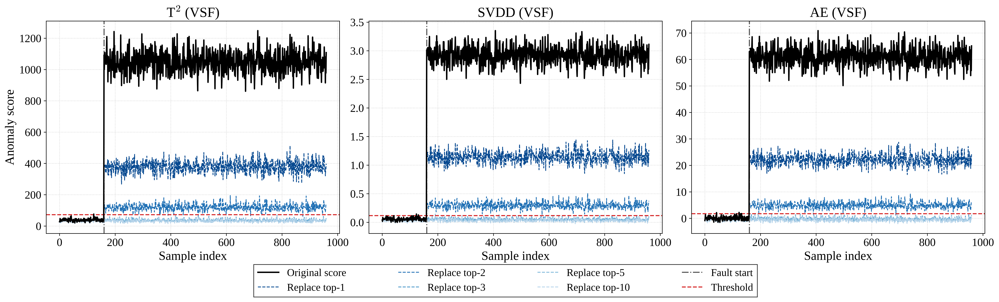

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ==========================================
# 1. SCI 出版级全局排版配置 
# ==========================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Liberation Serif", "DejaVu Serif"], 
    "mathtext.fontset": "cm", 
    "axes.unicode_minus": False,
    "font.size": 16,          # 【再放大】基础字号提升至 16
    "axes.titlesize": 20,     # 【再放大】子图标题提升至 20（拉开层级差距）
    "axes.labelsize": 18,     # 【再放大】XY轴标签提升至 18
    "xtick.labelsize": 16,    # 【再放大】刻度字号提升至 16
    "ytick.labelsize": 16,
    "legend.fontsize": 15,    # 【再放大】图例字号提升至 15
    "lines.linewidth": 2.0    # 【再放大】线宽进一步加粗至 2.0，避免大字配细线的单薄感
})

# ==========================================
# 2. 核心绘图函数
# ==========================================
def plot_removal_test_for_indicators(
    models,
    reference_points,
    x_test_scaled,
    threshold_dict,
    fault_start_idx=160,
    attribution_method="VSF",
    k_list=(1, 2, 3, 5, 10),
    x_normal=None,                     
    save_pdf_path="removal_test_3cols.pdf", 
    figsize=(20, 6),                      # 保持宽版尺寸不变
    dpi=300                               # 【修改】提升至出版级300 DPI
):
    indicator_names = list(models.keys())
    assert len(indicator_names) == 3, f"需要恰好3个模型，当前有{len(indicator_names)}个"

    fig, axes = plt.subplots(1, 3, figsize=figsize, dpi=dpi)
    if len(indicator_names) == 1:
        axes = [axes]  

    cmap = plt.get_cmap("Blues_r")
    colors = [cmap(x) for x in np.linspace(0.1, 0.7, len(k_list))]

    for idx, model_name in enumerate(indicator_names):
        ax = axes[idx]
        print("\n" + "=" * 60)
        print(f"Removal test for {model_name} using {attribution_method}")
        
        score_func = models[model_name]["score_numpy"]
        threshold = threshold_dict[model_name]
        reference = reference_points[model_name]

        if x_normal is None:
            raise ValueError("必须提供 x_normal 参数")
            
        explainers = build_all_explainers(
            model_name=model_name,
            reference=reference,
            x_normal=x_normal,
            models=models,
            method_labels=[attribution_method]
        )

        if attribution_method not in explainers or explainers[attribution_method] is None:
            ax.axis("off")
            ax.text(0.5, 0.5, f"No explainer\n{model_name}", ha='center', va='center', fontsize=14)
            continue

        explainer = explainers[attribution_method]
        original_scores = score_func(x_test_scaled).ravel()
        attrib_result = get_unified_output(explainer, x_test_scaled)
        contrib = attrib_result["abs_contrib"]

        contrib_fault = contrib[fault_start_idx:]
        mean_abs = np.mean(contrib_fault, axis=0)
        order = np.argsort(-mean_abs)

        # 1. 原始曲线
        ax.plot(original_scores, color="black", linewidth=2.0, label="Original score", zorder=10)

        # 2. 移除曲线
        for i, k in enumerate(k_list):
            k = min(k, x_test_scaled.shape[1])
            top_idx = order[:k]
            x_removed = x_test_scaled.copy()
            x_removed[:, top_idx] = reference[top_idx]
            removed_scores = score_func(x_removed).ravel()
            ax.plot(removed_scores, linewidth=1.2, linestyle="--", color=colors[i], label=f"Replace top-{k}")

        # 3. 辅助线
        ax.axvline(fault_start_idx, color="#555555", linestyle="-.", linewidth=1.5, label="Fault start")
        ax.axhline(threshold, color="#d62728", linestyle="--", linewidth=1.5, label="Threshold")

        title_text = model_name.replace("T²", r"T$^2$") 
        ax.set_title(f"{title_text} ({attribution_method})")
        ax.set_xlabel("Sample index")
        
        # 【修改】增加网格线提升学术图表可读性
        ax.grid(True, linestyle=":", alpha=0.6)
        
        if idx == 0:
            ax.set_ylabel("Anomaly score")

    # =========================
    # 布局与统一图例处理
    # =========================
    # 【修改】废弃 tight_layout，使用绝对比例精确控制边距
    # left/right 极小化两侧空白；bottom=0.21 为图例预留固定空间；wspace=0.12 压缩子图间距
    plt.subplots_adjust(left=0.04, right=0.98, bottom=0.21, top=0.92, wspace=0.1)
    
    # 提取第一个子图的句柄和标签
    handles, labels = axes[0].get_legend_handles_labels()
    
    # 【修改】图例定位优化
    import math
    n_items = len(handles)
    ncol = min(5, math.ceil(n_items / 2))   # 动态列数

    fig.legend(
        handles, labels,
        loc='lower center',
        bbox_to_anchor=(0.5, -0.02),
        ncol=ncol,
        frameon=True,
        edgecolor='black',
        fancybox=False,
        columnspacing=5
    )
    
    # 【修改】pad_inches 设为极小值 0.02，极限切除 PDF 保存时的白边
    plt.savefig(save_pdf_path, format="pdf", bbox_inches='tight', pad_inches=0.02)
    print(f"\n[INFO] 统一图例版高清矢量图已保存至: {save_pdf_path}")
    
    plt.show()
    plt.close(fig)

# ==========================================
# 调用执行区
# ==========================================
if __name__ == "__main__":
    plot_removal_test_for_indicators(
        models=models,
        reference_points=reference_points,
        x_test_scaled=x_outliers,
        threshold_dict=thresholds,
        fault_start_idx=160,
        attribution_method="VSF",
        k_list=(1, 2, 3, 5, 10),
        x_normal=x_normal,                     
        save_pdf_path="removal_test_3cols.pdf",
        figsize=(20, 6),                      
        dpi=300
    )


[INFO] PDF 矢量图已成功保存至: fer_curves_3cols.pdf


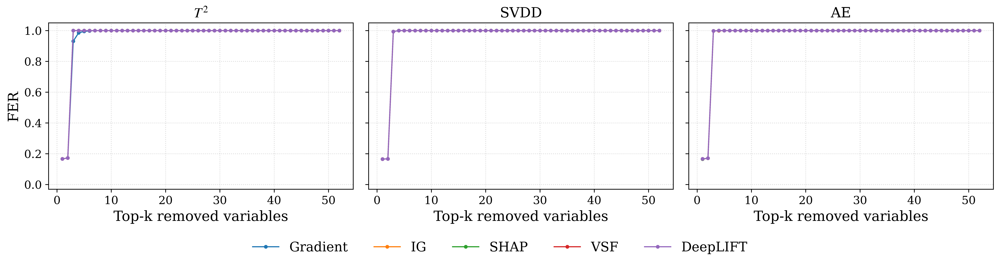

In [28]:
import numpy as np

def compute_fer_curve(score_func, x_test, threshold, contrib, ref):
    """
    计算故障消除率 (FER, Fault Elimination Rate) 曲线。
    
    参数:
    - score_func: 监测模型的评分函数，输入 (N, D) 的数据，返回 (N,) 的异常得分
    - x_test: 待测试的故障数据集，形状为 (N, D)
    - threshold: 该模型对应的异常检测控制限 (标量)
    - contrib: 归因算法输出的特征贡献度矩阵，形状为 (N, D)
    - ref: 正常状态参考点（通常是正常数据的均值向量），形状为 (D,)
    
    返回:
    - fer_curve: 长度为 D 的一维数组，fer_curve[k] 代表替换掉 Top-(k+1) 特征后的故障消除率
    """
    N, D = x_test.shape
    fer_curve = np.zeros(D)
    
    # 1. 贡献度取绝对值，因为正负异常波动都代表该变量偏离了正常状态
    contrib_abs = np.abs(contrib)
    
    # 2. 获取每个样本特征贡献度的降序索引
    # sorted_indices[i, 0] 表示第 i 个样本中贡献度最大的特征索引
    sorted_indices = np.argsort(-contrib_abs, axis=1)
    
    # 3. 复制一份测试数据用于逐步“修复”
    x_fixed = x_test.copy()
    
    # 4. 逐步替换 Top-k 的特征并重新打分
    for k in range(D):
        # 提取当前需要修复的第 k 大特征的索引
        # 使用高级索引批量替换 N 个样本的对应特征
        features_to_fix = sorted_indices[:, k]
        
        # 批量替换为参考点 (Normal reference) 的健康值
        x_fixed[np.arange(N), features_to_fix] = ref[features_to_fix]
        
        # 重新计算修复后的异常得分
        fixed_scores = score_func(x_fixed)
        
        # 统计得分降至阈值以下的样本比例（即故障被成功消除的比例）
        eliminated_count = np.sum(fixed_scores < threshold)
        fer_curve[k] = eliminated_count / N
        
    return fer_curve

import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# 学术级绘图样式配置 (Times New Roman 风格，不加粗)
# ==========================================
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "DejaVu Serif"], # 优先使用 Times New Roman
    "mathtext.fontset": "stix",                      # 数学公式使用 Stix 字体匹配
    "axes.titlesize": 15,
    "axes.labelsize": 15,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 10,
    "font.size": 12,
    "lines.linewidth": 1.2,
    "axes.grid": True,
    "grid.linestyle": ":",
    "grid.alpha": 0.6
})

def plot_three_model_fer(
    contrib_dict_all, models, thresholds, reference_points, x_vis,
    method_order=("Gradient", "IG", "SHAP", "VSF", "DeepLIFT"),
    figsize=(15, 4), 
    dpi=300,
    save_pdf_path="fer_curves_3cols.pdf" 
):
    """
    一行三列子图，使用新罗马字体美化，带有全局底部图例，并输出 PDF
    """
    model_names = list(contrib_dict_all.keys())
    # 确保只处理前3个模型
    model_names = model_names[:3] 
    
    fig, axes = plt.subplots(1, 3, figsize=figsize, dpi=dpi, sharey=True)
    
    for idx, model_name in enumerate(model_names):
        ax = axes[idx]
        contrib_dict = contrib_dict_all[model_name]
        score_func = models[model_name]["score_numpy"]
        threshold = thresholds[model_name]
        ref = reference_points[model_name]
        
        for method in method_order:
            if method not in contrib_dict or contrib_dict[method] is None:
                continue
            
            fer = compute_fer_curve(
                score_func=score_func, x_test=x_vis,
                threshold=threshold, contrib=contrib_dict[method], ref=ref
            )
            
            ax.plot(
                np.arange(1, len(fer) + 1),
                fer,
                marker="o", markersize=3,
                linewidth=1.2,
                label=method
            )
        
        # 自动将 T2 转换为 LaTeX 的 T^2 以保证数学符号美观
        title_text = model_name.replace("T²", r"$T^2$")
        
        # 子图美化
        ax.set_title(f"{title_text}", fontsize=15) # 字号可跟随之前的配置调大
        ax.set_xlabel("Top-k removed variables")
        if idx == 0:
            ax.set_ylabel("FER")
            
        ax.set_ylim(-0.03, 1.05)
        ax.grid(True, linestyle=":", alpha=0.5)
        
        # 【修改1】：这里原本的 ax.legend(...) 已被删除，防止每个图内部都挤一个图例

    # 【修改2】：获取第一个子图的图例句柄和标签 (避免 5 个方法被重复打印 3 次)
    handles, labels = axes[0].get_legend_handles_labels()
    
    # 【修改3】：添加全局底部图例
    # bbox_to_anchor 设为 (0.5, -0.05) 放在画布底部中间，ncol 根据方法数量自动排成一行
    fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.01), 
               ncol=len(method_order), frameon=False, fontsize=14)

    # 【修改4】：调整紧凑布局，重点是 rect 参数给底部留出空间 (这里预留了 12% 的底部空间)
    plt.tight_layout(rect=[0, 0.1, 1, 1])
    
    # ==========================================
    # PDF 保存执行区
    # ==========================================
    if save_pdf_path:
        plt.savefig(save_pdf_path, format="pdf", bbox_inches='tight', dpi=dpi)
        print(f"\n[INFO] PDF 矢量图已成功保存至: {save_pdf_path}")
        
    plt.show()

# ----------------------------------------------------------------

# 调用
plot_three_model_fer(
    contrib_dict_all=contrib_dict_all,
    models=models,
    thresholds=thresholds,
    reference_points=reference_points,
    x_vis=x_vis,
    method_order=("Gradient", "IG", "SHAP", "VSF", "DeepLIFT"),
    save_pdf_path="fer_curves_3cols.pdf" # 调用时指定文件名
)